# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset

Using TensorFlow backend.


In [2]:
dataset = get_dataset(tfrecord_path="../../data/processed/*.tfrecord",
                      label_map='../experiments/label_map.pbtxt')

INFO:tensorflow:Reading unweighted datasets: ['../../data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['../../data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow.compat.v1 as tf

def display_instances(batch, imgs_to_display=12):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    num_cols = 4
    if imgs_to_display % num_cols == 0:
        num_rows = imgs_to_display // num_cols
    else:
        num_rows = imgs_to_display % num_cols + 1

    # Setup plot space
    fig, axs = plt.subplots(nrows=num_rows,
                            ncols=num_cols,
                            figsize=(60, 60))

    # Colour mapping 
    # vehicles, 1: red,     pedestrians, 2: blue,        cyclists, 4: green
    colour_map = {1: 'red', 2: 'blue', 4: 'green'}

    for idx, record in enumerate(batch):

        # Get current row and col in subplots
        curr_row = idx // num_cols
        curr_col = idx % num_cols

        # Get metadata from dataset
        img = record["image"].numpy()
        img_shape = record["original_image_spatial_shape"].numpy()
        filename = record["filename"]
        truth_bboxes = record["groundtruth_boxes"].numpy()
        truth_classes = record["groundtruth_classes"].numpy()
        
        # Scale ground truth bounding boxes up to image size
        scaled_bboxes = truth_bboxes * np.tile(img_shape, 2)

        # Annotate bounding boxes
        for box, cls in zip(scaled_bboxes, truth_classes):
            btm_left = (box[1], box[0])                       
            width = box[3] - box[1]
            height = box[2] - box[0]

            # Annotate rectangle
            rec = patches.Rectangle(btm_left, width, height, linewidth=4, edgecolor=colour_map[cls], facecolor='none')
            axs[curr_row, curr_col].add_patch(rec)

        # Plot
        axs[curr_row, curr_col].imshow(img)
        plt.imshow(img)

    fig.savefig('../../assets/initial_data_exploratory.png')


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

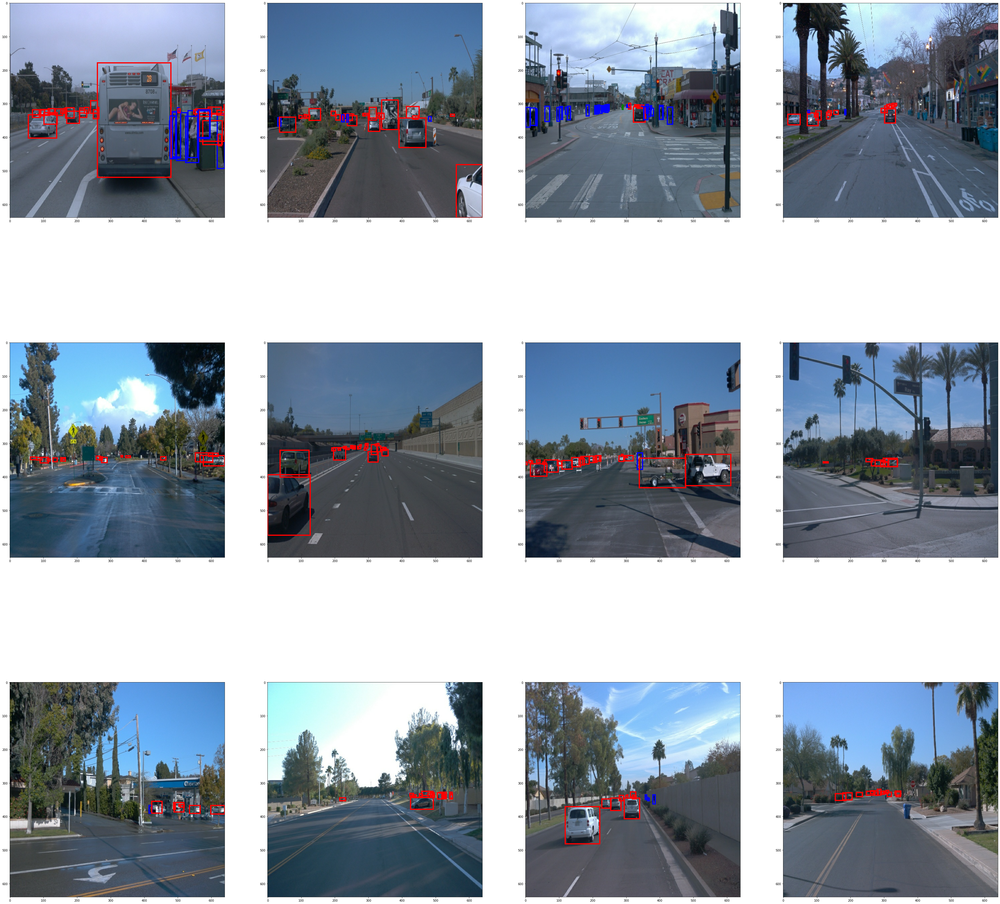

In [4]:
imgs_to_display = 12

batch = dataset.shuffle(100, reshuffle_each_iteration=True).take(imgs_to_display)
display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

From the exploratory dataset, we can immediately note down 2 things. First, there are many more cars compared to pedestrains and cyclists. Pedestrains and cyclists will form our subset of "rare classes" that we need to pay closer attention to. Second, the lighting and weather conditions vary across datasets. We need to ensure that there is proper representation of images with good and bad lighting, as well as good and adverse weather conditions.

For additional exploratory data analysis, we will check the spread of classes across each image to see how heavily the number of cars skew the dataset. We will also need to see check the distribution of lighting conditions. For that, we will find the average pixel value and covert to perceived brightness for each image.

#### Check distribution of classes

In [5]:
from collections import Counter

def get_cls_distribution(dataset):
    mapping = {"1": "vehicles",
            "2": "pedestrians",
            "4": "cyclists"}

    # Initialise class counter
    counter = Counter({'1': 0, '2': 0, '4': 0})

    # Count each class in each image
    data = dataset.take(100)
    for _, record in enumerate(data):
        truth_classes = record["groundtruth_classes"].numpy()
        counter += Counter(truth_classes)

    # Replace class numbers with their names
    counter = dict(counter)
    for old, new in mapping.items():
        counter[new] = counter.pop(int(old))

    return counter


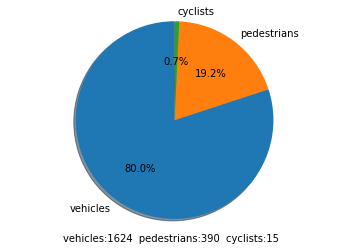

In [6]:
cls_counter = get_cls_distribution(dataset)

# Create a pie chart
k = cls_counter.keys()
v = cls_counter.values()
fig1, ax1 = plt.subplots()
ax1.pie(v, labels=k, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis("equal")
title = ""
for k, v in cls_counter.items():
    title += f"{k}:{v}  "
ax1.xaxis.set_label_position('bottom')
ax1.set_xlabel(title)    
fig1.set_facecolor('white')
fig1.savefig('../../assets/cls_distribution.png')

#### Check distribution of apparent brightness

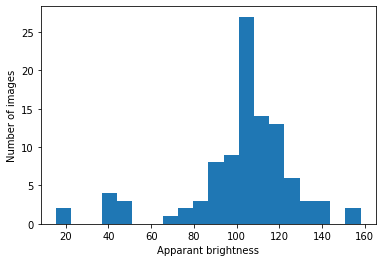

In [7]:
import cv2
import math

data = dataset.take(100)
arry = []
for idx, record in enumerate(data):
    img = record["image"].numpy()
    b, g, r, _ = cv2.mean(img)

    brightness = math.sqrt(0.241*(r**2) + 0.691*(g**2) + 0.068*(b**2))
    arry.append(brightness)

fig2, ax2 = plt.subplots(1, 1)
ax2.hist(arry, 20)
ax2.set_ylabel("Number of images")
ax2.set_xlabel("Apparant brightness")
plt.show()
fig2.savefig('../../assets/brightness_distribution.png')

From the data above, there are many more cars than other classes in the dataset, and the brightness values are skewed towards the brighter area. In the data augmentation step, these issues need to be addressed.